In [1]:
import dask

dask.config.set({"dataframe.query-planning": False})

import decoupler as dc
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

import sys
sys.path.extend(['../scripts','../scripts/xenium'])
import readwrite
import preprocessing

cfg = readwrite.config()

/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:504: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve th

## Params

In [57]:
# params
cell_type_annotation_dir = Path(cfg['xenium_cell_type_annotation_dir'])
xenium_processed_data_dir = Path(cfg['xenium_processed_data_dir'])
xenium_std_seurat_analysis_dir = Path(cfg['xenium_std_seurat_analysis_dir'])
normalisation = 'lognorm'
layer = 'data'
reference = 'matched_reference'
method = 'rctd_class_aware'
level = 'Level2.1_stroma'
n_comps = 50
max_n_cells = 100_000
singlets = False

# qc params
min_counts = 10
min_features = 5
max_counts = float("inf")
max_features = float("inf")
min_cells = 5

# common genes and samples to use
genes = []
samples = []

# fixed params
OBSM_KEY = "X_pca"
CT_KEY = 'cell type'#(reference, method, level)
BATCH_KEY = "sample"
annotation_normalisation = "lognorm"  # fix this for now, even for sctransfrom

palette_dir = Path(cfg['xenium_metadata_dir'])
sample_palette = pd.read_csv(palette_dir / 'col_palette_sample.csv').set_index('sample').squeeze()
cell_type_palette_path = palette_dir / 'col_palette_cell_types_combo.csv'


# if '2.1' in level:
#     palette_lvl2 = (
#         pd.read_csv(cell_type_palette_path)[["Level2", "cols_Level2"]].drop_duplicates().set_index("Level2").squeeze()
#     )
#     cell_type_palette = pd.read_csv(cell_type_palette_path)[[level, f"cols_{level}"]].drop_duplicates().set_index(level).squeeze()
#     for k, v in palette_lvl2.items():
#         if k not in cell_type_palette.index:
#             cell_type_palette[k] = palette_lvl2[k]

# else:
#     cell_type_palette = pd.read_csv(cell_type_palette_path)[[level, f"cols_{level}"]].drop_duplicates().set_index(level).squeeze()


stromal_types = ['fibroblast of lung', 'endothelial cell', 'pericyte','smooth muscle cell']
gene_sets = (
    pd.Series({
    "MYH11+ myoCAFs": ["MYH11", "CNN1", "LMOD1", "DES", "PLN", "PDGFRB"],
    "ADH1B+/NPNT+ CAFs": [],  # not in panel
    "MYH11+ CAFs": ["MYH11", "CNN1", "LMOD1", "DES", "PLN", "PDGFRB"],
    "ADH1B+ CAFs": [],  # not in panel
    "Pericytes": ["RGS5", "PDGFRB"],
    "CAVIN1+ CAFs": [],  # not in panel
    "COL3A1+ CAFs": ["COL5A2", "COL8A1", "THBS2", "FBN1", "NID1"],
    "CXCL12+ CAFs": ["CXCL5", "CXCL6", "CXCL9", "CXCL10", "CXCL13", "IL7R", "NFKB1"],
    "LRRC15+ CAFs": [],  # not in panel
    "CXCL5+ CAFs": ["CXCL5"],
    "CCL19 Type 1 CAFs": ["CCR7", "CXCL13", "PDPN"],
    "Neuroglial cells": ["S100B"],
    "Pericyte-derived myoCAFs": ["RGS5", "PDGFRB", "MYH11", "CNN1"],
    "NPNT+/LTBP2+ CAFs": ["LTBP2"],
    "CXCL2+/SLPI+ CAFs": [],  # not in panel
    "INMT+ CAFs": [],  # not in panel
    "ADH1B+/PI16+ CAFs": [], # not in panel
    "BCAM/RERGL CAFs": ["RERGL"],
    "TLS-associated CAFs": ["CXCL13", "CCR7", "PDPN"],
    "CXCL2+ CAFs": [],  # not in panel
    "CCL19 Type 2 CAFs": ["CCR7", "CXCL13", "PDPN"], # CCL19 not in panel
    "ATRN+ CAFs": [],  # not in panel
    "PI16+ CAFs": [], # not in panel
    "apCAFs": ["CD40"],  # Antigen-presenting CAFs
    "pan endothelial cell": ["VWF", "KDR", "CLDN5"],
    "capillary endothelial cell": ["PLVAP", "CA4", "AGER", "SFTPD", "SFTA2"],
    "arterial endothelial cell": ["GJA5", "BMX", "SELE"],
    "venous endothelial cell": ["ACKR1", "SELP"],
    "lymphatic endothelial cell": ["PROX1", "LYVE1", "PDPN"]
}).explode().reset_index())
gene_sets.columns = ["source", "target"]

In [71]:
for g in ['NPNT','CAVIN1','CXCL2','SLPI','ADH1B','PI16','ATRN','INMT','LRRC15']:
    print(g,np.isin(g,ad_merge.var_names))

NPNT False
CAVIN1 False
CXCL2 False
SLPI False
ADH1B False
PI16 False
ATRN False
INMT False
LRRC15 False


## Compute metrics

In [3]:
condition = 'NSCLC'
segmentation = 'proseg_expected'
panel_name = 'lung'

panel = xenium_std_seurat_analysis_dir / f"{segmentation}/{condition}/{panel_name}"

# read xenium samples
print("Reading samples")
ads = {}
for donor in (donors := panel.iterdir()):
    for sample in (samples_ := donor.iterdir()):
        if len(samples) and sample.stem not in samples:
            continue

            print(donor.stem, sample.stem)

        if segmentation == "proseg_expected":
            k = ("proseg", condition, panel.stem, donor.stem, sample.stem)
            k_annot = (segmentation, condition, panel.stem, donor.stem, sample.stem)

            name_sample = "/".join(k)
            name_annot = "/".join(k_annot)
            sample_dir = xenium_processed_data_dir / f"{name_sample}/raw_results"
        else:
            k = (segmentation.replace("proseg_mode", "proseg"), condition, panel.stem, donor.stem, sample.stem)
            k_annot = (segmentation, condition, panel.stem, donor.stem, sample.stem)
            name_sample = "/".join(k)
            name_annot = "/".join(k_annot)
            sample_dir = xenium_processed_data_dir / f"{name_sample}/normalised_results/outs"

        sample_normalised_counts_path = sample / f"{normalisation}/normalised_counts/{layer}.parquet"
        sample_idx_path = sample / f"{normalisation}/normalised_counts/cells.parquet"

        # read normalised data
        X_normalised = pd.read_parquet(sample_normalised_counts_path)
        X_normalised.index = pd.read_parquet(sample_idx_path).iloc[:, 0]
        X_normalised.columns = X_normalised.columns.str.replace(".", "-")  # undo seurat renaming

        if len(genes):
            # load raw data to reapply lower bounds QC filters
            ads[k] = readwrite.read_xenium_sample(sample_dir, anndata=True)
            if segmentation == "proseg_expected":
                ads[k].obs_names = "proseg-" + ads[k].obs_names.astype(str)

            # filter cells
            ads[k] = ads[k][X_normalised.index, X_normalised.columns]
            ads[k].layers["X_normalised"] = X_normalised
            if layer != "scale_data":  # no need to sparsify scale_data which is dense
                ads[k].layers["X_normalised"] = scipy.sparse.csr_matrix(ads[k].layers["X_normalised"])
        else:
            ads[k] = sc.AnnData(X_normalised)
            if layer != "scale_data":  # no need to sparsify scale_data which is dense
                ads[k].X = scipy.sparse.csr_matrix(ads[k].X)

        # read cell type annotation
        sample_annotation_dir = cell_type_annotation_dir / f"{name_annot}/{annotation_normalisation}/reference_based"
        annot_file = sample_annotation_dir / f"{reference}/{method}/{level}/single_cell/labels.parquet"
        ads[k].obs[CT_KEY] = pd.read_parquet(annot_file).set_index("cell_id").iloc[:, 0]

        if singlets:
            # read spot class
            spot_class_file = (
                sample_annotation_dir / f"{reference}/{method}/{level}/single_cell/output/results_df.parquet"
            )

            ads[k].obs["spot_class"] = pd.read_parquet(spot_class_file, columns=["cell_id", "spot_class"]).set_index(
                "cell_id"
            )
            ads[k] = ads[k][ads[k].obs["spot_class"] == "singlet"]


print("Concatenating")
# concatenate
xenium_levels = ["segmentation", "condition", "panel", "donor", "sample"]
for k in ads.keys():
    for i, lvl in enumerate(xenium_levels):
        ads[k].obs[lvl] = k[i]
ad_merge = sc.concat(ads)
print("Done")

# subset genes
if len(genes):
    print("Subsetting")

    genes_found = [
        g
        for g in ad_merge.var_names
        if (g in genes) or (g.replace(".", "-") in genes)  # possible seurat renaming
    ]

    print(f"Found {len(genes_found)} out of {len(genes)} genes.")
    ad_merge = ad_merge[:, genes_found].copy()
    # reapply QC to subset of genes
    preprocessing.preprocess(
        ad_merge,
        min_counts=min_counts,
        min_genes=min_features,
        max_counts=max_counts,
        max_genes=max_features,
        min_cells=min_cells,
        save_raw=False,
    )
    # replace X
    ad_merge.X = ad_merge.layers["X_normalised"]

# remove NaN  annotations
ad_merge = ad_merge[ad_merge.obs[CT_KEY].notna()]

#simplify malignant annot
if condition in ["NSCLC","mesothelioma_pilot"]:
    name_malignant = "malignant cell of lung"
elif condition == "breast":
    name_malignant = "malignant cell of breast"
else:
    name_malignant = "malignant cell"

ct_to_replace = ad_merge.obs[CT_KEY][ad_merge.obs[CT_KEY].str.contains("malignant cell")].unique()
replace_map = dict([[ct, name_malignant] for ct in ct_to_replace])
ad_merge.obs[CT_KEY] = ad_merge.obs[CT_KEY].replace(replace_map)

# subsample to reasonable size
# if len(ad_merge) > max_n_cells:
#     sc.pp.subsample(ad_merge, n_obs=max_n_cells)

# compute pca
# sc.tl.pca(ad_merge, n_comps=n_comps)


# add precomputed umap
df_umap = pd.read_parquet(cfg['results_dir']+f'embed_panel/{segmentation}/{condition}/{panel_name}/{normalisation}/umap_{layer}_n_comps=50_n_neighbors=50_min_dist=0.5_euclidean.parquet')
df_umap["cell_id"] = df_umap.index
ad_merge.obs['cell_id'] = ad_merge.obs_names

ad_merge.obs = ad_merge.obs.merge(
    df_umap,
    on=xenium_levels + ['cell_id'],
    how="left"
).set_index('cell_id')
ad_merge.obsm['X_umap'] = ad_merge.obs[['UMAP1', 'UMAP2']].values

Reading samples
Concatenating


/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Done


/tmp/ipykernel_1645930/166587732.py:119: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad_merge.obs[CT_KEY] = ad_merge.obs[CT_KEY].replace(replace_map)
/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
... storing 'cell type' as categorical
/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attr

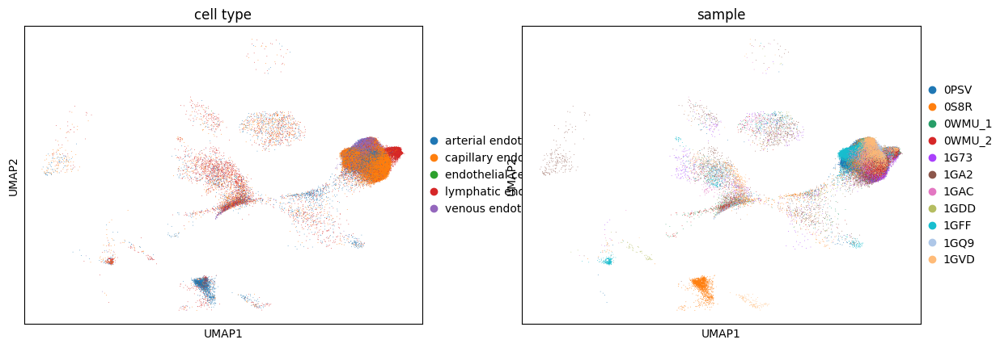

In [14]:
ad_plot = ad_merge[ad_merge.obs[CT_KEY].str.contains('endothelial')]
sc.pl.umap(ad_plot, color=[CT_KEY, 'sample'])

In [ ]:
# 

# mode = 'counts'

# df_plot = ad_merge.obs.groupby('sample')['cell type']
# if mode == 'props':
#     df_plot = df_plot.value_counts(normalize=True)
# elif mode == 'counts':
#     df_plot = df_plot.value_counts()

# df_plot = df_plot.unstack()
# df_stromal_plot = df_plot[stromal_types]
# df_stromal_plot = df_stromal_plot.loc[df_stromal_plot.sum(1).sort_values(ascending=False).index]

# ax = df_stromal_plot.plot(
#     kind="bar",
#     stacked=True,
#     figsize=(10, 6)
# )

# ax.set_ylabel("Proportion")
# ax.set_xlabel("Sample")
# ax.set_title("Stromal cell type proportions")
# plt.legend(title="Cell type", bbox_to_anchor=(1.05, 1), loc="upper left")
# plt.tight_layout()
# plt.show()

## Score gene sets

In [53]:
cell_types = [
    "CAF",
    "endothelial"
]

ads_ct = {}
for ct in cell_types:

    ct_sets = gene_sets[gene_sets['source'].str.contains(ct)]
    ad_ct = ad_merge[ad_merge.obs[CT_KEY].str.contains(ct)].copy()

    print(ct)
    print(len(ad_ct))

    sc.tl.pca(ad_ct)
    sc.pp.neighbors(ad_ct)
    sc.tl.leiden(ad_ct, flavor="igraph", n_iterations=2, resolution=1.5)
    sc.tl.umap(ad_ct)

    ads_ct[ct] = ad_ct

/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


CAF
223714


/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


endothelial
92625


/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
... storing 'ulm_label' as categorical


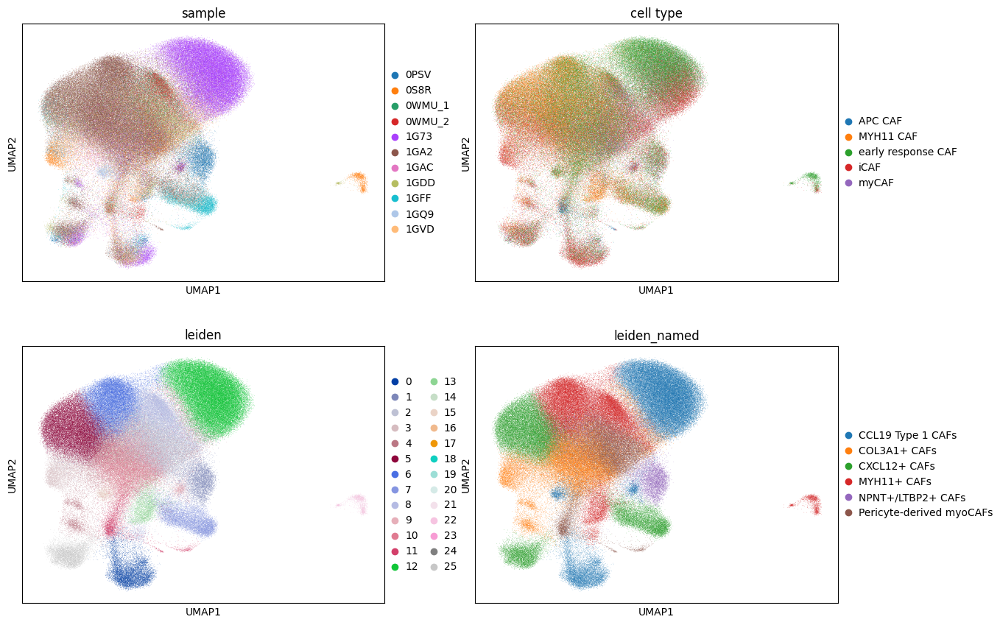

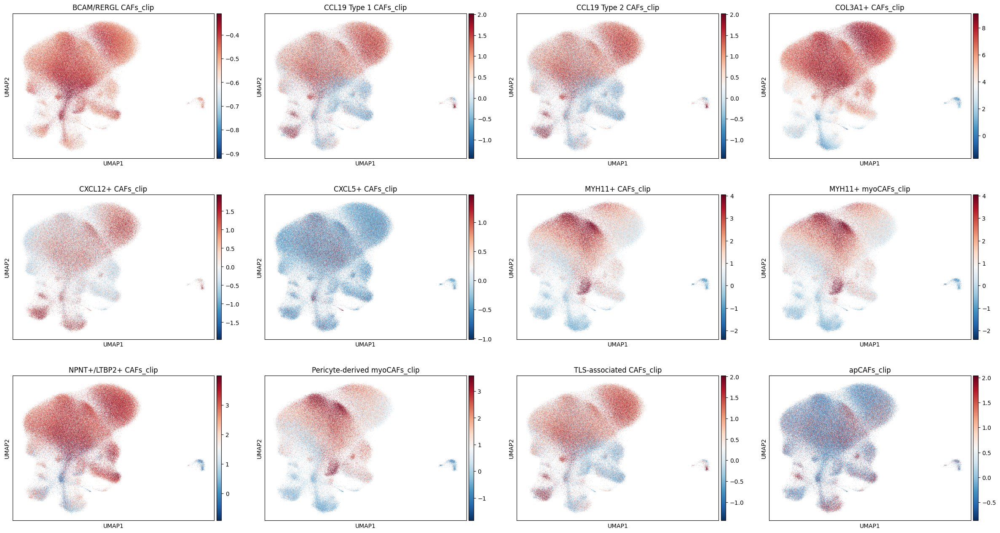

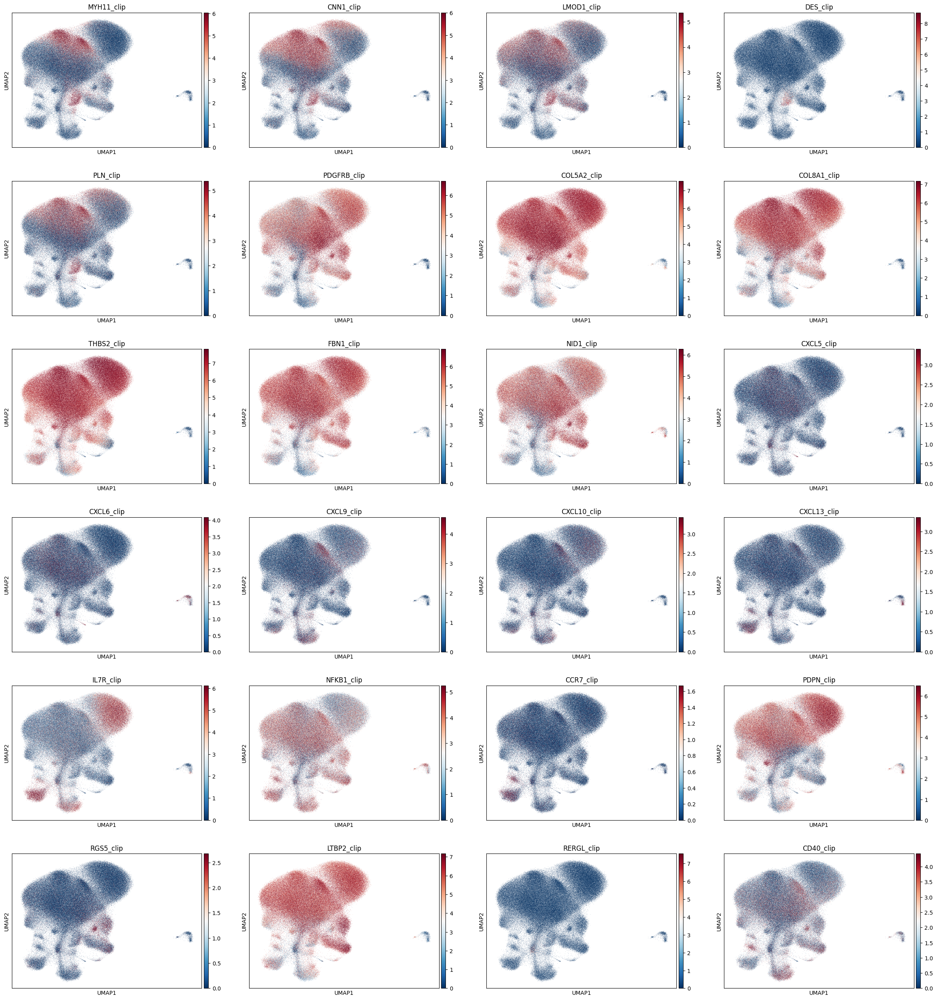

/work/PRTNR/CHUV/DIR/rgottar1/spatial/env/jbac/miniforge3/envs/spatial/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
... storing 'ulm_label' as categorical


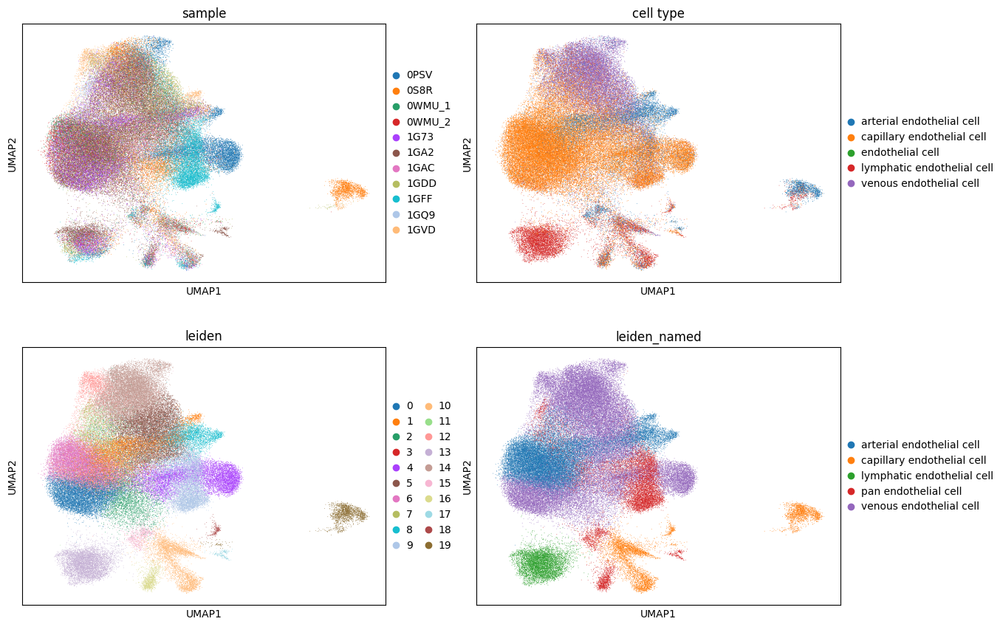

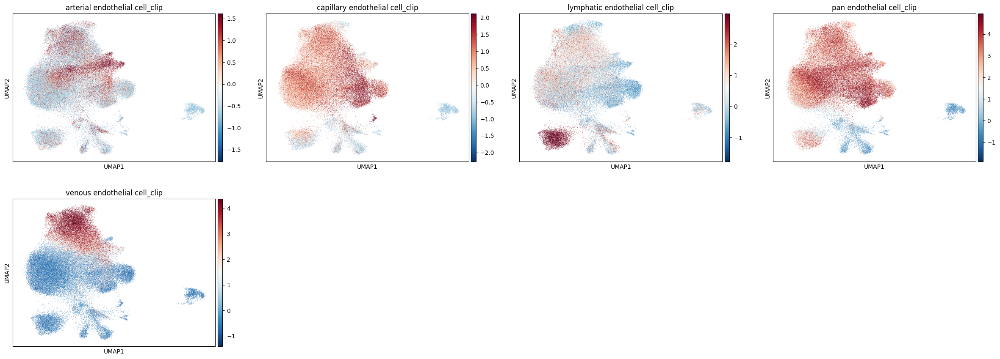

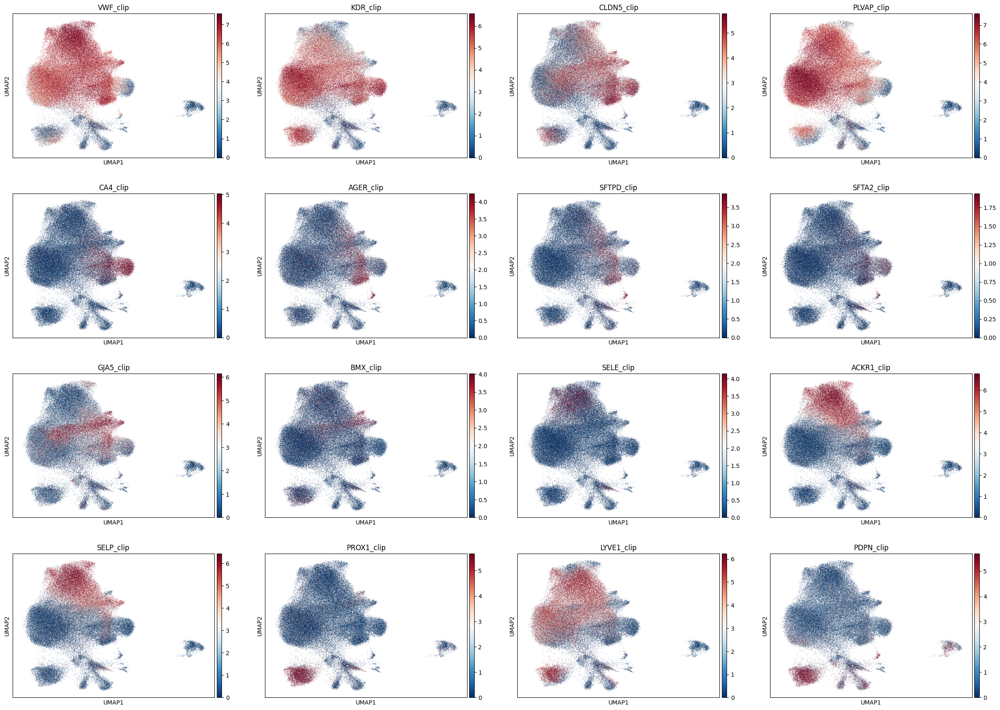

In [70]:
clip = lambda x: np.clip(x, a_min=None, a_max=np.percentile(x, q=95))

cell_types = [
    "CAF",
    "endothelial"
]

for ct in cell_types:
    ad_ct = ads_ct[ct]

    ct_sets = gene_sets[gene_sets['source'].str.contains(ct)]

    dc.mt.ulm(ad_ct, ct_sets, tmin=0)
    ad_ct.obs["ulm_label"] = ad_ct.obsm["score_ulm"].idxmax(1)
    ad_ct.obs = ad_ct.obs.assign(**ad_ct.obsm["score_ulm"])


    # plotting 
    score = dc.pp.get_obsm(ad_ct, key="score_ulm")
    df = dc.tl.rankby_group(score, groupby="leiden", reference="rest")
    df['name']=df['name'].astype(str)

    dict_ann = df.groupby("group",observed=False).head(1).set_index("group")["name"].to_dict()
    ad_ct.obs["leiden_named"] = ad_ct.obs["leiden"].astype(str).replace(dict_ann).astype('category')


    u_marker_genes = pd.Series(ct_sets['target'].unique()).dropna()
    for g in u_marker_genes:
        g_clip = clip(ad_ct[:,g].X.toarray().flatten())
        if np.all(g_clip == 0):
            g_clip = ad_ct[:,g].X.toarray().flatten()
        ad_ct.obs[g+'_clip'] = g_clip

    for c in ad_ct.obsm["score_ulm"].columns:
        ad_ct.obs[c+'_clip'] = clip(ad_ct.obsm["score_ulm"][c])

    sc.pl.umap(
        ads_ct[ct],
        color=["sample", CT_KEY, 'leiden','leiden_named'],
        ncols=2,
    )
    sc.pl.umap(ad_ct, color=ad_ct.obsm["score_ulm"].columns+'_clip', cmap="RdBu_r")
    sc.pl.umap(ad_ct, color=u_marker_genes+'_clip', cmap="RdBu_r")

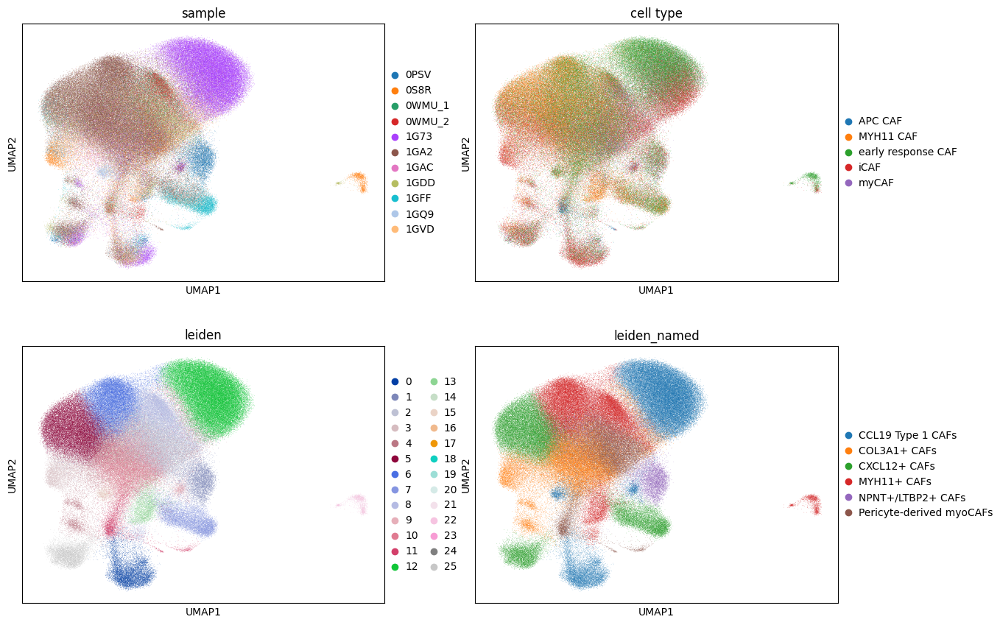

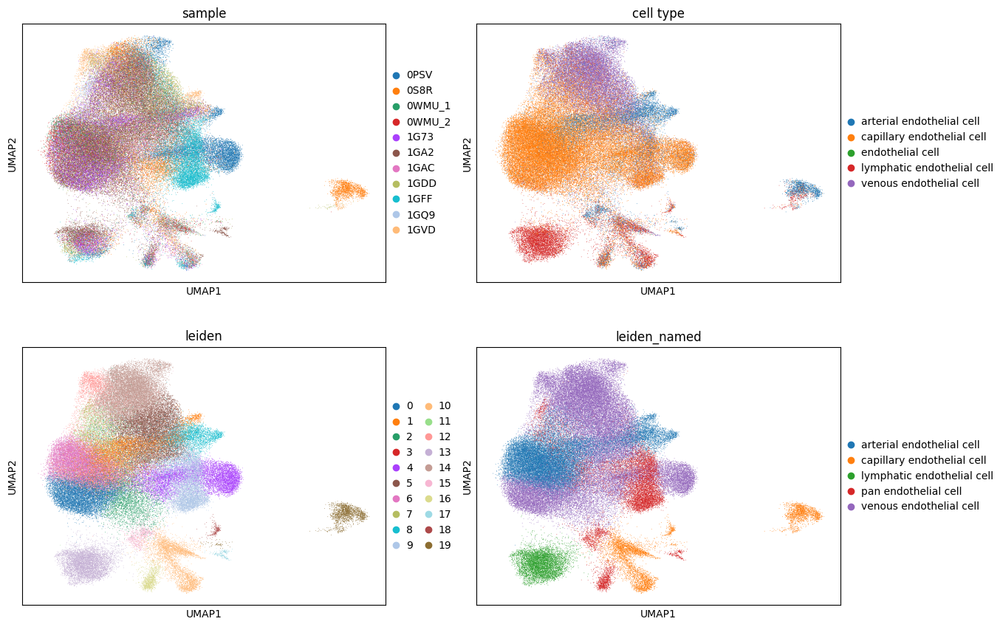

In [61]:
for ct in cell_types:

    sc.pl.umap(
        ads_ct[ct],
        color=["sample", CT_KEY, 'leiden','leiden_named'],
        ncols=2,
    )

## snRNAseq

In [ ]:
adata_sc = sc.read(cfg[''])